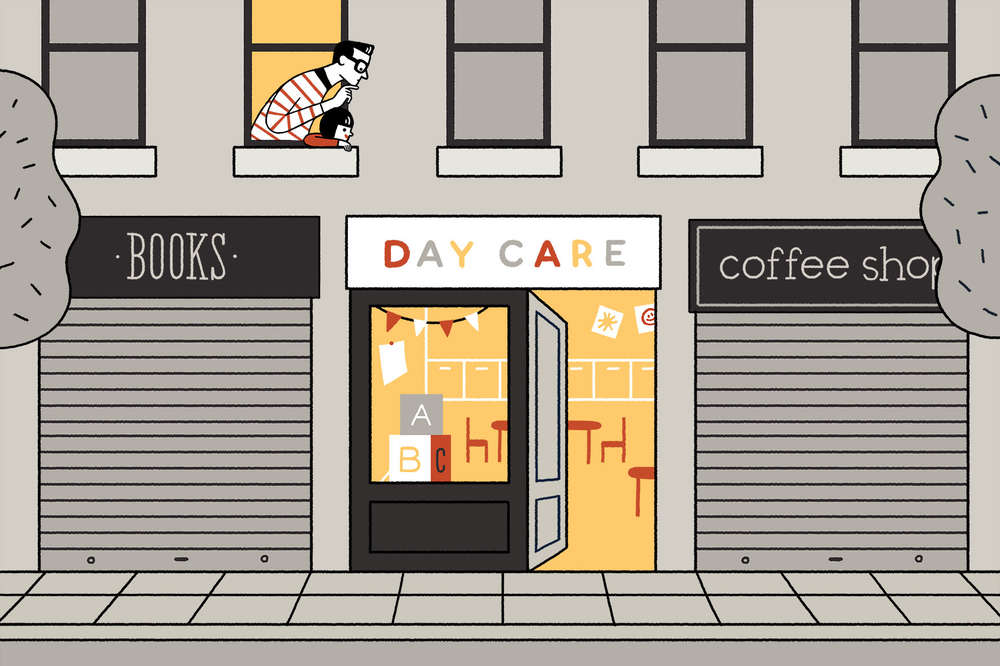

<h1 align=center><font size = 5>Is a Childcare Facility in the Heart of the City a Viable Business?</font></h1>
<h1 align=center><font size = 3><em>Munish Kumar</em></font></h1>

# Introduction

Toronto is a busy, diverse city, and is one of the most populous cities in Canada. Toronto is an international centre of business, finance, arts, and culture, and is recognized as one of the most multicultural and cosmopolitan cities in the world.

Toronto has a population of just under 3 million, with almost 50% being between the ages of 15-44. Also, 5% of the population is from 0-4 years of age <a href="https://en.wikipedia.org/wiki/Demographics_of_Toronto#Age_structure">(1) </a>. 

It is therefore no stretch of the imagination that a young population such as the one in Toronto, with its young families, will require access to childcare and early child education facilities. 

Often, such facilities are located in the suburbs, but would an enterprising entrepreneur consider opening a business related to early childhood in the city centre? Would there be a demand for this business model? Would working parents appreciate such a facility?

## Table of Contents
<div class="alert alert-block alert-info" style="margin-top: 20px"><font size = 3>

1. <a href="item1"> Loading and Preprocessing the Data</a>

2. <a href="item2"> Analysis of neighbourhood and boroughs in Toronto with FourSquare</a>
    
3. <a href="#item3">Using <em>k</em> to determine Business feasibility</a>

4. <a href="#item4">Conclusion</a></font>
</font>
</div>

#### import Libraries

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import time
import re
import requests
import pickle
import seaborn as sns
import os
import glob
sns.set()

from functools import reduce
from datetime import timedelta, date

pd.set_option("display.max_columns", None)
pd.set_option("display.max_rows", None)

# library to handle requests, parse HTML and XML
from bs4 import BeautifulSoup
import requests

# import k-means from clustering stage
from sklearn.cluster import KMeans

# convert an address into latitude and longitude values
from geopy.geocoders import Nominatim

# map rendering library
import folium 

print("Libraries imported.")

Libraries imported.


In [2]:
# Start, test
start = time.time()

Declare some global variables

In [3]:
dir_name = 'C:/Users/quant/Anaconda3/@DATA/Coursera'
filename_suffix = 'csv'
ADDRESS = 'Toronto, CA'

# Foursquare ID, secret, API version
CLIENT_ID = 'XDPVEBAEEO0B5D0X3ASQWVHL44BBYYCVKEUTQ1KJLE4SA0KM' 
CLIENT_SECRET = 'RLUSKFNWLI5GVLZKHCDWPACH0WFFGCVE1UL5BF51XPMCZOIO'
VERSION = '20180605'

LIMIT = 100 # limit of number of venues returned by Foursquare API
RADIUS = 800 # define radius

### 1. Loading and Preprocessing the Data 

#### Perform table extraction from wiki using Beautiful Soup 4

In [4]:
url = 'https://en.wikipedia.org/wiki/List_of_postal_codes_of_Canada:_M'
page = requests.get(url)
page.content

soup = BeautifulSoup(page.content, 'html.parser')
print(soup.prettify())

<!DOCTYPE html>
<html class="client-nojs" dir="ltr" lang="en">
 <head>
  <meta charset="utf-8"/>
  <title>
   List of postal codes of Canada: M - Wikipedia
  </title>
  <script>
   document.documentElement.className="client-js";RLCONF={"wgBreakFrames":!1,"wgSeparatorTransformTable":["",""],"wgDigitTransformTable":["",""],"wgDefaultDateFormat":"dmy","wgMonthNames":["","January","February","March","April","May","June","July","August","September","October","November","December"],"wgRequestId":"XsnThApAIC4AAE50mMAAAAAO","wgCSPNonce":!1,"wgCanonicalNamespace":"","wgCanonicalSpecialPageName":!1,"wgNamespaceNumber":0,"wgPageName":"List_of_postal_codes_of_Canada:_M","wgTitle":"List of postal codes of Canada: M","wgCurRevisionId":958430791,"wgRevisionId":958430791,"wgArticleId":539066,"wgIsArticle":!0,"wgIsRedirect":!1,"wgAction":"view","wgUserName":null,"wgUserGroups":["*"],"wgCategories":["Articles with short description","Communications in Ontario","Postal codes in Canada","Toronto","Ontario

Use beautiful soup to scan through the table and find the headings I am interested in. This is to verify that BeautifulSoup has found what I am looking for

In [5]:
# Can also use soup.find(class_='wikitable sortable')
table = soup.find_all(class_='sortable')

for tab in table:
    ths = tab.find_all('th')
    headings = [th.get_text() for th in ths]
    if headings[0:3] == ['Postal Code','Borough','Neighborhood']:
        break
headings

['Postal Code\n', 'Borough\n', 'Neighborhood\n']

Now I will pass this to a dataframe. Note that pd.read_html creates a list of dataframes, meaning that for this table, we only select index 0

In [6]:
df_wiki_table = pd.read_html(str(table))
df_wiki_table[0]

,Postal Code,Borough,Neighborhood
0,M1A,Not assigned,NaN
1,M2A,Not assigned,NaN
2,M3A,North York,Parkwoods
3,M4A,North York,Victoria Village
4,M5A,Downtown Toronto,"Regent Park, Harbourfront"
5,M6A,North York,"Lawrence Manor, Lawrence Heights"
6,M7A,Downtown Toronto,"Queen's Park, Ontario Provincial Government"
7,M8A,Not assigned,NaN
8,M9A,Etobicoke,"Islington Avenue, Humber Valley Village"
9,M1B,Scarborough,"Malvern, Rouge"


#### Create a checkpoint file 

In [7]:
# Write out the table as a csv as a checkpoint file
base_filename = 'CA_Post_Code'
csvs_sht = os.path.join(dir_name, base_filename + "." + filename_suffix)
df_wiki_table[0].to_csv(csvs_sht, index = False, header=True)
print ("Final File Extract Produced")

Final File Extract Produced


In [8]:
# Will reload the file that was produced and start analysis
df = pd.read_csv('CA_Post_Code.csv')
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 180 entries, 0 to 179
Data columns (total 3 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Postal Code   180 non-null    object
 1   Borough       180 non-null    object
 2   Neighborhood  103 non-null    object
dtypes: object(3)
memory usage: 4.3+ KB


The groupby method will be used on the 'Postal Code' column to arrange the data. I will also drop all cells that are 'Not Assigned' and recreate the index

In [9]:
df_new = df.groupby(df['Postal Code']).sum()
mask = df_new[df_new['Borough']!='Not assigned']
mask = mask.rename_axis('PostalCode').reset_index()

count = 0

for i in range(len(df_new['Borough'])):
    if df_new['Neighborhood'][i] == 'Not assigned':
        df_new['Neighborhood'][i] = df_new['Borough']
        count = i
print('Number of Neighbourhoods which were not assigned: ', count)
print('------------------------------------------------------------------')

print('----------------------Information on Table------------------------')
print(mask.info())
print('------------------------------------------------------------------')

print('----------------------Statistics on Table-----------------------\n', 
      mask.describe(include = 'all'))
print('------------------------------------------------------------------')

print('--------------------------Shape of Table------------------------\n', 
      mask.shape)
print('------------------------------------------------------------------')

mask

Number of Neighbourhoods which were not assigned:  0
------------------------------------------------------------------
----------------------Information on Table------------------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 103 entries, 0 to 102
Data columns (total 3 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   PostalCode    103 non-null    object
 1   Borough       103 non-null    object
 2   Neighborhood  103 non-null    object
dtypes: object(3)
memory usage: 2.5+ KB
None
------------------------------------------------------------------
----------------------Statistics on Table-----------------------
        PostalCode     Borough Neighborhood
count         103         103          103
unique        103          10           99
top           M7A  North York    Downsview
freq            1          24            4
------------------------------------------------------------------
--------------------------Shape of Tabl

,PostalCode,Borough,Neighborhood
0,M1B,Scarborough,"Malvern, Rouge"
1,M1C,Scarborough,"Rouge Hill, Port Union, Highland Creek"
2,M1E,Scarborough,"Guildwood, Morningside, West Hill"
3,M1G,Scarborough,Woburn
4,M1H,Scarborough,Cedarbrae
5,M1J,Scarborough,Scarborough Village
6,M1K,Scarborough,"Kennedy Park, Ionview, East Birchmount Park"
7,M1L,Scarborough,"Golden Mile, Clairlea, Oakridge"
8,M1M,Scarborough,"Cliffside, Cliffcrest, Scarborough Village West"
9,M1N,Scarborough,"Birch Cliff, Cliffside West"


Load the geospatial coordinates for all the different postal codes

In [10]:
df_new = pd.read_csv('C:/Users/quant/Anaconda3/@DATA/Coursera/Geospatial_Coordinates.csv')
df_new

,Postal Code,Latitude,Longitude
0,M1B,43.806686,-79.194353
1,M1C,43.784535,-79.160497
2,M1E,43.763573,-79.188711
3,M1G,43.770992,-79.216917
4,M1H,43.773136,-79.239476
5,M1J,43.744734,-79.239476
6,M1K,43.727929,-79.262029
7,M1L,43.711112,-79.284577
8,M1M,43.716316,-79.239476
9,M1N,43.692657,-79.264848


In [11]:
mask['Latitude']=np.where(df_new['Postal Code'] == mask['PostalCode'],
                         df_new['Latitude'],
                         0)
mask['Longitude']=np.where(df_new['Postal Code'] == mask['PostalCode'],
                         df_new['Longitude'],
                         0)
print('-------------------Information on Empty Cells---------------------')
print(mask.isnull().sum())
print('------------------------------------------------------------------')
print('-------------------Information on Data Cells----------------------')
print(mask.info())
print('------------------------------------------------------------------')
print('-------------------Information on Final Frame---------------------')
mask

-------------------Information on Empty Cells---------------------
PostalCode      0
Borough         0
Neighborhood    0
Latitude        0
Longitude       0
dtype: int64
------------------------------------------------------------------
-------------------Information on Data Cells----------------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 103 entries, 0 to 102
Data columns (total 5 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   PostalCode    103 non-null    object 
 1   Borough       103 non-null    object 
 2   Neighborhood  103 non-null    object 
 3   Latitude      103 non-null    float64
 4   Longitude     103 non-null    float64
dtypes: float64(2), object(3)
memory usage: 4.1+ KB
None
------------------------------------------------------------------
-------------------Information on Final Frame---------------------


,PostalCode,Borough,Neighborhood,Latitude,Longitude
0,M1B,Scarborough,"Malvern, Rouge",43.806686,-79.194353
1,M1C,Scarborough,"Rouge Hill, Port Union, Highland Creek",43.784535,-79.160497
2,M1E,Scarborough,"Guildwood, Morningside, West Hill",43.763573,-79.188711
3,M1G,Scarborough,Woburn,43.770992,-79.216917
4,M1H,Scarborough,Cedarbrae,43.773136,-79.239476
5,M1J,Scarborough,Scarborough Village,43.744734,-79.239476
6,M1K,Scarborough,"Kennedy Park, Ionview, East Birchmount Park",43.727929,-79.262029
7,M1L,Scarborough,"Golden Mile, Clairlea, Oakridge",43.711112,-79.284577
8,M1M,Scarborough,"Cliffside, Cliffcrest, Scarborough Village West",43.716316,-79.239476
9,M1N,Scarborough,"Birch Cliff, Cliffside West",43.692657,-79.264848


#### Create a second checkpoint file 

In [12]:
# Write out the table as a csv as a checkpoint file
base_filename = 'CA_Post_Code_Long_Lat'
csvs_sht = os.path.join(dir_name, base_filename + "." + filename_suffix)
mask.to_csv(csvs_sht, index = False, header=True)
print ("Final File Extract Produced")

Final File Extract Produced


In [13]:
print('The dataframe has {} boroughs and {} neighborhoods.'.format(
        len(mask['Borough'].unique()),
        mask.shape[0]
    )
)

The dataframe has 10 boroughs and 103 neighborhoods.


In [14]:
#count Bourough and Neighborhood
mask.groupby('Borough')['Neighborhood'].count()

Borough
Central Toronto      9
Downtown Toronto    19
East Toronto         5
East York            5
Etobicoke           12
Mississauga          1
North York          24
Scarborough         17
West Toronto         6
York                 5
Name: Neighborhood, dtype: int64

Let focus only on boroughs that have a large number of neighbourhoods. In this case, I set the filter to more than 4 i.e. I only want to analyze boroughs that have more than 4 neighbourhoods.

In [15]:
# Use Transform and boolean indexing to create new dataframe
df_analysis = mask[mask.groupby('Borough')['Neighborhood'].transform('count')>4]
df_analysis.groupby('Borough')['Neighborhood'].count()

Borough
Central Toronto      9
Downtown Toronto    19
East Toronto         5
East York            5
Etobicoke           12
North York          24
Scarborough         17
West Toronto         6
York                 5
Name: Neighborhood, dtype: int64

### 2. Analysis of neighbourhood and boroughs in Toronto with FourSquare

#### Define Foursquare Credentials and Version

In [16]:
print('Your credentails:')
print('CLIENT_ID: ' + CLIENT_ID)
print('CLIENT_SECRET:' + CLIENT_SECRET)

Your credentails:
CLIENT_ID: XDPVEBAEEO0B5D0X3ASQWVHL44BBYYCVKEUTQ1KJLE4SA0KM
CLIENT_SECRET:RLUSKFNWLI5GVLZKHCDWPACH0WFFGCVE1UL5BF51XPMCZOIO


Let's get the geographical coordinates of Toronto and display with Folium.

In [17]:
address = ADDRESS # check global variable

geolocator = Nominatim(user_agent = 'cntry_explorer')
location = geolocator.geocode(address)
latitude = location.latitude
longitude = location.longitude
print("Geographical Coordinates of Toronto are {}, {}."\
      .format(latitude, longitude)
     )

# Generate map centered around the area
loc_map = folium.Map(location=[latitude, longitude], zoom_start=10)

# Add the zones above as red circle
for lat, lng, borough, neighbourhood in zip(
    df_analysis['Latitude'], 
    df_analysis['Longitude'],
    df_analysis['Borough'],
    df_analysis['Neighborhood']):
    
    label = '{},{}'.format(neighbourhood, borough)
    label = folium.Popup(label, parse_html=True)
    
    folium.CircleMarker(
        [lat, lng], radius = 5, popup=label, color = 'red', 
        fill_color = '#3186cc', fill_opacity = 0.7, fill = True,
        parse_html=False).add_to(loc_map)

loc_map

Geographical Coordinates of Toronto are 43.6534817, -79.3839347.


#### Function that processes all neighbourhoods in Toronto

In [18]:
def getNearbyVenues(names, latitudes, longitudes, radius=RADIUS):
    
    venues_list=[]
    for name, lat, lng in zip(names, latitudes, longitudes):
        print(name)
            
        # create the API request URL
        url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
            CLIENT_ID, 
            CLIENT_SECRET, 
            VERSION, 
            lat, 
            lng, 
            RADIUS, 
            LIMIT)
            
        # make the GET request
        results = requests.get(url).json()["response"]['groups'][0]['items']
        
        # return only relevant information for each nearby venue
        venues_list.append([(
            name, 
            lat, 
            lng, 
            v['venue']['name'], 
            v['venue']['location']['lat'], 
            v['venue']['location']['lng'],  
            v['venue']['categories'][0]['name']) for v in results])

    
    nearby_venues = pd.DataFrame([item for venue_list in venues_list for item in venue_list])
    nearby_venues.columns = ['Neighborhood', 
                  'Neighborhood Latitude', 
                  'Neighborhood Longitude', 
                  'Venue', 
                  'Venue Latitude', 
                  'Venue Longitude', 
                  'Venue Category']
    
    return(nearby_venues)

In [19]:
toronto_venues = getNearbyVenues(names=df_analysis['Neighborhood'],
                                 latitudes=df_analysis['Latitude'],
                                 longitudes=df_analysis['Longitude'])

Malvern, Rouge
Rouge Hill, Port Union, Highland Creek
Guildwood, Morningside, West Hill
Woburn
Cedarbrae
Scarborough Village
Kennedy Park, Ionview, East Birchmount Park
Golden Mile, Clairlea, Oakridge
Cliffside, Cliffcrest, Scarborough Village West
Birch Cliff, Cliffside West
Dorset Park, Wexford Heights, Scarborough Town Centre
Wexford, Maryvale
Agincourt
Clarks Corners, Tam O'Shanter, Sullivan
Milliken, Agincourt North, Steeles East, L'Amoreaux East
Steeles West, L'Amoreaux West
Upper Rouge
Hillcrest Village
Fairview, Henry Farm, Oriole
Bayview Village
York Mills, Silver Hills
Willowdale, Newtonbrook
Willowdale, Willowdale East
York Mills West
Willowdale, Willowdale West
Parkwoods
Don Mills
Don Mills
Bathurst Manor, Wilson Heights, Downsview North
Northwood Park, York University
Downsview
Downsview
Downsview
Downsview
Victoria Village
Parkview Hill, Woodbine Gardens
Woodbine Heights
The Beaches
Leaside
Thorncliffe Park
East Toronto, Broadview North (Old East York)
The Danforth West, 

In [20]:
#Check size of resulting dataframe
print('Dataframe size: ', toronto_venues.shape)
print(toronto_venues.head())
print('The dataframe has {} unique neighborhoods and {} unique venue categories.'.format(
        len(toronto_venues['Neighborhood'].unique()),
        len(toronto_venues['Venue Category'].unique())))

Dataframe size:  (3900, 7)
     Neighborhood  Neighborhood Latitude  Neighborhood Longitude  \
0  Malvern, Rouge              43.806686              -79.194353   
1  Malvern, Rouge              43.806686              -79.194353   
2  Malvern, Rouge              43.806686              -79.194353   
3  Malvern, Rouge              43.806686              -79.194353   
4  Malvern, Rouge              43.806686              -79.194353   

                 Venue  Venue Latitude  Venue Longitude  \
0              Wendy’s       43.807448       -79.199056   
1              Wendy's       43.802008       -79.198080   
2  Staples Morningside       43.800285       -79.196607   
3          Tim Hortons       43.802000       -79.198169   
4           Lee Valley       43.803161       -79.199681   

                  Venue Category  
0           Fast Food Restaurant  
1           Fast Food Restaurant  
2  Paper / Office Supplies Store  
3                    Coffee Shop  
4                     Hobby Shop  

In [21]:
print(type(toronto_venues))
print(toronto_venues['Venue Category'].unique())
print(type(toronto_venues['Venue Category'].unique()))
#.unique().str.contains('park')

<class 'pandas.core.frame.DataFrame'>
['Fast Food Restaurant' 'Paper / Office Supplies Store' 'Coffee Shop'
 'Hobby Shop' 'Spa' 'Business Service' 'Bus Station' 'Trail'
 'African Restaurant' 'Auto Workshop' 'Chinese Restaurant' 'Restaurant'
 'Burger Joint' 'Italian Restaurant' 'Breakfast Spot' 'Bar'
 'Fried Chicken Joint' 'Pizza Place' 'Bank' 'Beer Store' 'Sports Bar'
 'Greek Restaurant' 'Supermarket' 'Grocery Store' 'Park'
 'Hakka Restaurant' 'Caribbean Restaurant' 'Indian Restaurant'
 'Thai Restaurant' 'Athletics & Sports' 'Music Store' 'Bakery'
 'Gas Station' 'Yoga Studio' 'Flower Shop' 'Board Shop'
 'Gym / Fitness Center' 'Bus Line' 'Convenience Store' 'Ice Cream Shop'
 'Sandwich Place' 'Department Store' 'Discount Store' 'Pharmacy'
 'Light Rail Station' 'Intersection' 'Rental Car Location' 'Metro Station'
 'Soccer Field' 'Diner' 'Hardware Store' 'Café' 'General Entertainment'
 'Skating Rink' 'College Stadium' 'Gym' 'Electronics Store' 'Pet Store'
 'Vietnamese Restaurant' 'Furnitur

In [22]:
# check if the results contain the following elements
lst = {"Childcare Centre", "School", "Kindergarten", "Pre-School"}
toronto_venues[toronto_venues['Venue Category'].isin(lst)]

,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category


There is no mention of any sort of childcare facility above. This is surprising, but assuming the extraction is correct, I will, as an alternative, look for things that are important "must haves" or "nice to haves", should a childcare center be formed nearby. Right now, my intention is to find exactly where they are located.

In [23]:
# check if the results contain the following elements
lst = {"Medical Center", "Playground", "Park", "Aquarium"
       "Soccer Field", "Swim School", "Summer Camp", "Museum",
      "Garden", "History Museum", "Office", "Baseball Field",
      "Pool", "School", "Elementary School", "Library"}
pot_cc = toronto_venues[toronto_venues['Venue Category'].isin(lst)]
print(pot_cc.shape)
pot_cc

# Another way of checking is via list comprehension. This is not efficient
# because the pandas solution is way more elegant
# I only did this for learning
#common_elements = [elem for elem in lst if elem in [
#    k for i in toronto_venues.values for k in i]]
#print(common_elements)
#
## This is an expanded version of the list comprehension above
#df_values = [k for i in toronto_venues.values for k in i]
## Compare original list elements to dataframe values:
#common_elements2 = [elem for elem in lst if elem in df_values]
#print(common_elements2)

(159, 7)


,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
38,Woburn,43.770992,-79.216917,Heather Heights Park,43.776594,-79.215052,Park
39,Woburn,43.770992,-79.216917,Densgrove Park,43.765397,-79.220130,Park
99,"Golden Mile, Clairlea, Oakridge",43.711112,-79.284577,Warden Woods Park,43.710527,-79.278966,Park
107,"Cliffside, Cliffcrest, Scarborough Village West",43.716316,-79.239476,Cathedral Bluffs Park,43.718895,-79.230827,Park
120,"Birch Cliff, Cliffside West",43.692657,-79.264848,Scotia Parkette,43.695304,-79.271826,Park
121,"Birch Cliff, Cliffside West",43.692657,-79.264848,Crescentwood Park,43.686585,-79.266475,Park
197,"Clarks Corners, Tam O'Shanter, Sullivan",43.781638,-79.304302,Vradenburg Park,43.776160,-79.307757,Park
208,"Milliken, Agincourt North, Steeles East, L'Amo...",43.815252,-79.284577,Port Royal Park,43.815477,-79.289773,Park
218,"Milliken, Agincourt North, Steeles East, L'Amo...",43.815252,-79.284577,Alexmuir Park,43.808640,-79.282189,Park
242,Hillcrest Village,43.803762,-79.363452,Cummer Park,43.799564,-79.371175,Park


#### Perform one hot encoding on the venues of interest 

In [24]:
pot_cc_onehot = pd.get_dummies(pot_cc[['Venue Category']], 
                               prefix="", prefix_sep="")
print(pot_cc_onehot.info())
pot_cc_onehot

<class 'pandas.core.frame.DataFrame'>
Int64Index: 159 entries, 38 to 3844
Data columns (total 9 columns):
 #   Column          Non-Null Count  Dtype
---  ------          --------------  -----
 0   Baseball Field  159 non-null    uint8
 1   Garden          159 non-null    uint8
 2   History Museum  159 non-null    uint8
 3   Library         159 non-null    uint8
 4   Museum          159 non-null    uint8
 5   Office          159 non-null    uint8
 6   Park            159 non-null    uint8
 7   Playground      159 non-null    uint8
 8   Pool            159 non-null    uint8
dtypes: uint8(9)
memory usage: 2.6 KB
None


,Baseball Field,Garden,History Museum,Library,Museum,Office,Park,Playground,Pool
38,0,0,0,0,0,0,1,0,0
39,0,0,0,0,0,0,1,0,0
99,0,0,0,0,0,0,1,0,0
107,0,0,0,0,0,0,1,0,0
120,0,0,0,0,0,0,1,0,0
121,0,0,0,0,0,0,1,0,0
197,0,0,0,0,0,0,1,0,0
208,0,0,0,0,0,0,1,0,0
218,0,0,0,0,0,0,1,0,0
242,0,0,0,0,0,0,1,0,0


In [25]:
# add postal, borough and neighborhood column back to dataframe
pot_cc_onehot['Neighborhood'] = toronto_venues['Neighborhood'] 


fixed_columns = list(pot_cc_onehot)
fixed_columns.insert(0, fixed_columns.pop(fixed_columns.index('Neighborhood')))
pot_cc_onehot=pot_cc_onehot.loc[:,fixed_columns]

pot_cc_onehot.head()

,Neighborhood,Baseball Field,Garden,History Museum,Library,Museum,Office,Park,Playground,Pool
38,Woburn,0,0,0,0,0,0,1,0,0
39,Woburn,0,0,0,0,0,0,1,0,0
99,"Golden Mile, Clairlea, Oakridge",0,0,0,0,0,0,1,0,0
107,"Cliffside, Cliffcrest, Scarborough Village West",0,0,0,0,0,0,1,0,0
120,"Birch Cliff, Cliffside West",0,0,0,0,0,0,1,0,0


#### Group by Neighbourhood, taking the mean of frequency of occurance for each category

In [26]:
cc_grouped=pot_cc_onehot.groupby(['Neighborhood']).mean().reset_index()
print(cc_grouped.shape)
cc_grouped

(73, 10)


,Neighborhood,Baseball Field,Garden,History Museum,Library,Museum,Office,Park,Playground,Pool
0,"Alderwood, Long Branch",0.000000,0.000000,0.0,0.00,0.000000,0.000000,0.500000,0.000000,0.500000
1,"Bathurst Manor, Wilson Heights, Downsview North",0.000000,0.000000,0.0,0.00,0.000000,0.000000,1.000000,0.000000,0.000000
2,Bayview Village,0.000000,0.000000,0.0,0.00,0.000000,0.000000,1.000000,0.000000,0.000000
3,"Bedford Park, Lawrence Manor East",0.000000,0.000000,0.0,0.00,0.000000,0.000000,1.000000,0.000000,0.000000
4,Berczy Park,0.000000,0.000000,0.0,0.00,0.333333,0.000000,0.666667,0.000000,0.000000
5,"Birch Cliff, Cliffside West",0.000000,0.000000,0.0,0.00,0.000000,0.000000,1.000000,0.000000,0.000000
6,"Brockton, Parkdale Village, Exhibition Place",0.000000,0.000000,0.0,0.00,0.000000,0.000000,1.000000,0.000000,0.000000
7,"Business reply mail Processing Centre, South C...",0.000000,0.500000,0.0,0.00,0.000000,0.000000,0.500000,0.000000,0.000000
8,"CN Tower, King and Spadina, Railway Lands, Har...",0.000000,0.000000,0.0,0.00,0.000000,0.000000,1.000000,0.000000,0.000000
9,Caledonia-Fairbanks,0.000000,0.000000,0.0,0.00,0.000000,0.000000,1.000000,0.000000,0.000000


In [27]:
cc_grouped.columns.values

array(['Neighborhood', 'Baseball Field', 'Garden', 'History Museum',
       'Library', 'Museum', 'Office', 'Park', 'Playground', 'Pool'],
      dtype=object)

In [30]:
to_cc = cc_grouped[['Neighborhood', 'Baseball Field', 'Garden', 'History Museum', 
                    'Library', 'Museum', 'Office', 'Park', 'Playground', 'Pool']]
to_cc

,Neighborhood,Baseball Field,Garden,History Museum,Library,Museum,Office,Park,Playground,Pool
0,"Alderwood, Long Branch",0.000000,0.000000,0.0,0.00,0.000000,0.000000,0.500000,0.000000,0.500000
1,"Bathurst Manor, Wilson Heights, Downsview North",0.000000,0.000000,0.0,0.00,0.000000,0.000000,1.000000,0.000000,0.000000
2,Bayview Village,0.000000,0.000000,0.0,0.00,0.000000,0.000000,1.000000,0.000000,0.000000
3,"Bedford Park, Lawrence Manor East",0.000000,0.000000,0.0,0.00,0.000000,0.000000,1.000000,0.000000,0.000000
4,Berczy Park,0.000000,0.000000,0.0,0.00,0.333333,0.000000,0.666667,0.000000,0.000000
5,"Birch Cliff, Cliffside West",0.000000,0.000000,0.0,0.00,0.000000,0.000000,1.000000,0.000000,0.000000
6,"Brockton, Parkdale Village, Exhibition Place",0.000000,0.000000,0.0,0.00,0.000000,0.000000,1.000000,0.000000,0.000000
7,"Business reply mail Processing Centre, South C...",0.000000,0.500000,0.0,0.00,0.000000,0.000000,0.500000,0.000000,0.000000
8,"CN Tower, King and Spadina, Railway Lands, Har...",0.000000,0.000000,0.0,0.00,0.000000,0.000000,1.000000,0.000000,0.000000
9,Caledonia-Fairbanks,0.000000,0.000000,0.0,0.00,0.000000,0.000000,1.000000,0.000000,0.000000


### 3. Using *k*-means to determine Business Feasibility

#### Lets cluster into 3 zones

In [31]:
kclusters = 3
cc_cluster = to_cc.drop(['Neighborhood'], axis =1)
cc_cluster

,Baseball Field,Garden,History Museum,Library,Museum,Office,Park,Playground,Pool
0,0.000000,0.000000,0.0,0.00,0.000000,0.000000,0.500000,0.000000,0.500000
1,0.000000,0.000000,0.0,0.00,0.000000,0.000000,1.000000,0.000000,0.000000
2,0.000000,0.000000,0.0,0.00,0.000000,0.000000,1.000000,0.000000,0.000000
3,0.000000,0.000000,0.0,0.00,0.000000,0.000000,1.000000,0.000000,0.000000
4,0.000000,0.000000,0.0,0.00,0.333333,0.000000,0.666667,0.000000,0.000000
5,0.000000,0.000000,0.0,0.00,0.000000,0.000000,1.000000,0.000000,0.000000
6,0.000000,0.000000,0.0,0.00,0.000000,0.000000,1.000000,0.000000,0.000000
7,0.000000,0.500000,0.0,0.00,0.000000,0.000000,0.500000,0.000000,0.000000
8,0.000000,0.000000,0.0,0.00,0.000000,0.000000,1.000000,0.000000,0.000000
9,0.000000,0.000000,0.0,0.00,0.000000,0.000000,1.000000,0.000000,0.000000


In [32]:
# Run K-means
kmeans = KMeans(n_clusters=kclusters, random_state=0).fit(cc_cluster)

#Check cluster label
kmeans.labels_[:10]

array([2, 0, 0, 0, 1, 0, 0, 1, 0, 0])

In [33]:
#Create a copy
cc_merged=to_cc.copy()

# add cluster label
cc_merged["Cluster Label"] = kmeans.labels_

#add Longitude and Latitude
cc_merged = cc_merged.join(toronto_venues.set_index("Neighborhood"), 
                           on="Neighborhood")
cc_merged

,Neighborhood,Baseball Field,Garden,History Museum,Library,Museum,Office,Park,Playground,Pool,Cluster Label,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,"Alderwood, Long Branch",0.000000,0.000000,0.0,0.00,0.000000,0.000000,0.500000,0.000000,0.500000,2,43.602414,-79.543484,Il Paesano Pizzeria & Restaurant,43.601280,-79.545028,Pizza Place
0,"Alderwood, Long Branch",0.000000,0.000000,0.0,0.00,0.000000,0.000000,0.500000,0.000000,0.500000,2,43.602414,-79.543484,Timothy's Pub,43.600165,-79.544699,Pub
0,"Alderwood, Long Branch",0.000000,0.000000,0.0,0.00,0.000000,0.000000,0.500000,0.000000,0.500000,2,43.602414,-79.543484,Toronto Gymnastics International,43.599832,-79.542924,Gym
0,"Alderwood, Long Branch",0.000000,0.000000,0.0,0.00,0.000000,0.000000,0.500000,0.000000,0.500000,2,43.602414,-79.543484,Tim Hortons,43.602396,-79.545048,Coffee Shop
0,"Alderwood, Long Branch",0.000000,0.000000,0.0,0.00,0.000000,0.000000,0.500000,0.000000,0.500000,2,43.602414,-79.543484,Pizza Pizza,43.605340,-79.547252,Pizza Place
0,"Alderwood, Long Branch",0.000000,0.000000,0.0,0.00,0.000000,0.000000,0.500000,0.000000,0.500000,2,43.602414,-79.543484,Subway,43.599152,-79.544395,Sandwich Place
0,"Alderwood, Long Branch",0.000000,0.000000,0.0,0.00,0.000000,0.000000,0.500000,0.000000,0.500000,2,43.602414,-79.543484,Taras Shevchenko Ukrainian Community Centre,43.602207,-79.543662,Dance Studio
0,"Alderwood, Long Branch",0.000000,0.000000,0.0,0.00,0.000000,0.000000,0.500000,0.000000,0.500000,2,43.602414,-79.543484,Rexall,43.601951,-79.545694,Pharmacy
0,"Alderwood, Long Branch",0.000000,0.000000,0.0,0.00,0.000000,0.000000,0.500000,0.000000,0.500000,2,43.602414,-79.543484,Alderwood Pool,43.601802,-79.547247,Pool
0,"Alderwood, Long Branch",0.000000,0.000000,0.0,0.00,0.000000,0.000000,0.500000,0.000000,0.500000,2,43.602414,-79.543484,Sir Adam Beck Rink,43.602526,-79.547455,Skating Rink


In [34]:
#sort by cluster labels
cc_merged.sort_values(['Cluster Label'], inplace = True)
cc_merged.dropna(axis=0, inplace=True)
cc_merged

,Neighborhood,Baseball Field,Garden,History Museum,Library,Museum,Office,Park,Playground,Pool,Cluster Label,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
36,"Lawrence Manor, Lawrence Heights",0.000000,0.000000,0.0,0.00,0.000000,0.000000,1.000000,0.000000,0.000000,0,43.718518,-79.464763,Marche Istanbul,43.719129,-79.457631,Grocery Store
38,"Little Portugal, Trinity",0.000000,0.000000,0.0,0.00,0.000000,0.000000,1.000000,0.000000,0.000000,0,43.647927,-79.419750,Cafe Neon,43.644130,-79.419670,Café
38,"Little Portugal, Trinity",0.000000,0.000000,0.0,0.00,0.000000,0.000000,1.000000,0.000000,0.000000,0,43.647927,-79.419750,Jimmy's Coffee,43.644521,-79.418908,Coffee Shop
38,"Little Portugal, Trinity",0.000000,0.000000,0.0,0.00,0.000000,0.000000,1.000000,0.000000,0.000000,0,43.647927,-79.419750,Tiger of Sweden Toronto,43.645474,-79.419395,Men's Store
38,"Little Portugal, Trinity",0.000000,0.000000,0.0,0.00,0.000000,0.000000,1.000000,0.000000,0.000000,0,43.647927,-79.419750,Veghed,43.649224,-79.422326,Vegetarian / Vegan Restaurant
38,"Little Portugal, Trinity",0.000000,0.000000,0.0,0.00,0.000000,0.000000,1.000000,0.000000,0.000000,0,43.647927,-79.419750,Crywolf,43.646207,-79.419583,Boutique
38,"Little Portugal, Trinity",0.000000,0.000000,0.0,0.00,0.000000,0.000000,1.000000,0.000000,0.000000,0,43.647927,-79.419750,Hanmoto,43.649505,-79.422768,Asian Restaurant
38,"Little Portugal, Trinity",0.000000,0.000000,0.0,0.00,0.000000,0.000000,1.000000,0.000000,0.000000,0,43.647927,-79.419750,Ufficio,43.649439,-79.423014,Italian Restaurant
38,"Little Portugal, Trinity",0.000000,0.000000,0.0,0.00,0.000000,0.000000,1.000000,0.000000,0.000000,0,43.647927,-79.419750,Rotate This,43.648544,-79.420518,Record Shop
38,"Little Portugal, Trinity",0.000000,0.000000,0.0,0.00,0.000000,0.000000,1.000000,0.000000,0.000000,0,43.647927,-79.419750,Bazara,43.648535,-79.420521,Japanese Restaurant


In [38]:
# Matplotlib and associated plotting modules
import matplotlib.cm as cm
import matplotlib.colors as colors

# create map
map_clusters = folium.Map(location=[latitude, longitude], zoom_start=11)

# set color scheme for the clusters
x = np.arange(kclusters)
ys = [i+x+(i*x)**2 for i in range(kclusters)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]

# add markers to the map
markers_colors = []
for lat, lon, poi, cluster in zip(cc_merged['Neighborhood Latitude'], cc_merged['Neighborhood Longitude'], cc_merged['Neighborhood'], cc_merged['Cluster Label']):
    label = folium.Popup('{} - Cluster {}'.format(poi, cluster), parse_html=True)
    folium.CircleMarker(
        [lat, lon],
        radius=5,
        popup=label,
        color='black',
        fill=True,
        fill_color=rainbow[cluster-1],
        fill_opacity=0.6).add_to(map_clusters)
       
map_clusters

#### Function to Analyze each Cluster

In [41]:
def cluster_analysis(label):
    print("Baseball Field:")
    print(cc_merged[(cc_merged['Cluster Label'] == label) & (cc_merged['Baseball Field'] >0 )]['Neighborhood'].unique())
    print("\n")
    #print("Elementary School:")
    #print(cc_merged[(cc_merged['Cluster Label'] == label) & (cc_merged['Elementary School'] >0 )]['Neighborhood'].unique())
    #print("\n")
    print("Garden:")
    print(cc_merged[(cc_merged['Cluster Label'] == label) & (cc_merged['Garden'] >0 )]['Neighborhood'].unique())
    print("\n")
    print("History Museum:")
    print(cc_merged[(cc_merged['Cluster Label'] == label) & (cc_merged['History Museum'] >0 )]['Neighborhood'].unique())
    print("\n")
    print("Library:")
    print(cc_merged[(cc_merged['Cluster Label'] == label) & (cc_merged['Library'] >0 )]['Neighborhood'].unique())
    print("\n")
    #print("Medical Center:")
    #print(cc_merged[(cc_merged['Cluster Label'] == label) & (cc_merged['Medical Center'] >0 )]['Neighborhood'].unique())
    #print("\n")
    print("Museum:")
    print(cc_merged[(cc_merged['Cluster Label'] == label) & (cc_merged['Museum'] >0 )]['Neighborhood'].unique())
    print("\n")
    print("Office:")
    print(cc_merged[(cc_merged['Cluster Label'] == label) & (cc_merged['Office'] >0 )]['Neighborhood'].unique())
    print("\n")
    print("Park:")
    print(cc_merged[(cc_merged['Cluster Label'] == label) & (cc_merged['Park'] >0 )]['Neighborhood'].unique())
    print("\n")
    print("Playground:")
    print(cc_merged[(cc_merged['Cluster Label'] == label) & (cc_merged['Playground'] >0 )]['Neighborhood'].unique())
    print("\n")
    print("Pool:")
    print(cc_merged[(cc_merged['Cluster Label'] == label) & (cc_merged['Pool'] >0 )]['Neighborhood'].unique())
    print("\n")
    #print("School:")
    #print(cc_merged[(cc_merged['Cluster Label'] == label) & (cc_merged['School'] >0 )]['Neighborhood'].unique())
    #print("\n")
    return

#### Analyze each Cluster

In [42]:
#Cluster 0
cluster_analysis(0)

Baseball Field:
['High Park, The Junction South' 'Downsview']


Garden:
[]


History Museum:
[]


Library:
[]


Museum:
[]


Office:
['Central Bay Street']


Park:
['Lawrence Manor, Lawrence Heights' 'Little Portugal, Trinity'
 'Lawrence Park' 'Kensington Market, Chinatown, Grange Park'
 'Mimico NW, The Queensway West, South of Bloor, Kingsway Park South West, Royal York South West'
 'Moore Park, Summerhill East'
 'New Toronto, Mimico South, Humber Bay Shores'
 "Milliken, Agincourt North, Steeles East, L'Amoreaux East"
 'High Park, The Junction South' 'Golden Mile, Clairlea, Oakridge'
 'East Toronto, Broadview North (Old East York)'
 'Forest Hill North & West, Forest Hill Road Park'
 'Eringate, Bloordale Gardens, Old Burnhamthorpe, Markland Wood'
 'Hillcrest Village' 'Humewood-Cedarvale'
 "Old Mill South, King's Mill Park, Sunnylea, Humber Bay, Mimico NE, The Queensway East, Royal York South East, Kingsway Park South East"
 'The Beaches' 'The Danforth West, Riverdale' 'Studio District'

Cluster 0 is furthest from the city center, and borders the central areas. This cluster is mostly composed of parks, playgounds and pools. 
1. No surprises but its mostly in the suburbs.
2. There is an office in Central Street 
3. Pools are located in regent park, harbourfront.
3. There are plenty of Parks in CN Tower, King and Spadina, Railway Lands, Harbourfront West, Bathurst Quay, South Niagara, Kensington Market, Chinatown, Grange Park, Church and Wellesley.
4. TO get to a playground at Moore Park, one would have to move out of the central zone.

In [43]:
#Cluster 1
cluster_analysis(1)

Baseball Field:
['India Bazaar, The Beaches West']


Garden:
['Business reply mail Processing Centre, South Central Letter Processing Plant Toronto'
 'Garden District, Ryerson' 'India Bazaar, The Beaches West'
 'North Toronto West, Lawrence Park']


History Museum:
['The Annex, North Midtown, Yorkville']


Library:
['St. James Town, Cabbagetown']


Museum:
['St. James Town' 'Stn A PO Boxes' 'The Annex, North Midtown, Yorkville'
 'Toronto Dominion Centre, Design Exchange' 'Berczy Park'
 'University of Toronto, Harbord'
 "Queen's Park, Ontario Provincial Government"
 'Harbourfront East, Union Station, Toronto Islands'
 'Commerce Court, Victoria Hotel' 'First Canadian Place, Underground city'
 'Richmond, Adelaide, King']


Office:
['University of Toronto, Harbord'
 "Queen's Park, Ontario Provincial Government"]


Park:
['St. James Town' 'Stn A PO Boxes'
 'Business reply mail Processing Centre, South Central Letter Processing Plant Toronto'
 'St. James Town, Cabbagetown' 'The Annex, North 

Cluster 1 is closest to the city center but contains everything except pools.
1. There are many parks and gardens in this cluster
2. Offices are colocated nearby
3. All the attractions are colocated as well

In [44]:
#Cluster 2
cluster_analysis(2)

Baseball Field:
['Don Mills' 'Humberlea, Emery']


Garden:
['Roselawn']


History Museum:
['Don Mills']


Library:
[]


Museum:
[]


Office:
[]


Park:
['Willowdale, Willowdale East' 'Alderwood, Long Branch'
 'Parkdale, Roncesvalles']


Playground:
['Roselawn' 'Glencairn' 'Parkdale, Roncesvalles']


Pool:
['Willowdale, Willowdale East' 'York Mills, Silver Hills'
 'Alderwood, Long Branch' 'Parkdale, Roncesvalles']




Cluster 2 is intermediate between the city center but contains no offices in this group.
1. Only a single garden is Roselawn is present (but there are 6 neighbourhoods with parks)
2. The nieghbourhoods with parks are pretty far apart, and also contain a pool and in some cases a playground.

### 4. Conclusion

There is indeed potential for this business of opening a childcare facility close to the city centre, but this must be carefully calibrated with other things. In my analysis, potentially, it seems like somewhere within the “cluster 1” zone, there is scope to start one, given the existence of parks, gardens, museums, playgrounds and office infrastructure.

However, this analysis is only dependent on one data source i.e. the map data from Foursquare, as well as “offset data” from the “secondary venues”. An entrepreneur should actually scope the ground, and must also consider things like rent, availability of space, other competition in the form of nurseries not listed on the Foursquare site, and if there is a demand in that area in the form of young families.

In [45]:
count = 'Completed Process'
elapsed = (time.time() - start)
print ("%s in %s seconds" % (count,elapsed))

Completed Process in 1755.4105832576752 seconds
